In [ ]:
from __future__ import absolute_import
from __future__ import division
from __future__ import print_function

import sys
sys.path.append("../../..")


import matplotlib.pyplot as plt
import tensorflow_datasets as tfds
import os
from argparse import Namespace
from absl import app
from absl import flags
import numpy as np
import PIL
import tensorflow as tf
from tensorflow_gan.examples.cyclegan import data_provider
from tensorflow_gan.examples.cyclegan import networks
import json

In [ ]:
def _make_dir_if_not_exists(dir_path):
    """Make a directory if it does not exist."""
    if not tf.io.gfile.exists(dir_path):
        tf.io.gfile.makedirs(dir_path)

def _file_output_path(dir_path, input_file_path):
    """Create output path for an individual file."""
    return os.path.join(dir_path, os.path.basename(input_file_path))

def make_inference_graph(model_name, patch_dim):
    """Build the inference graph for either the X2Y or Y2X GAN.

    Args:
      model_name: The var scope name 'ModelX2Y' or 'ModelY2X'.
      patch_dim: An integer size of patches to feed to the generator.

    Returns:
      Tuple of (input_placeholder, generated_tensor).
    """
    input_hwc_pl = tf.compat.v1.placeholder(tf.float32, [None, None, 3])

    # Expand HWC to NHWC
    images_x = tf.expand_dims(
        data_provider.full_image_to_patch(input_hwc_pl, patch_dim), 0)

    with tf.compat.v1.variable_scope(model_name):
        with tf.compat.v1.variable_scope('Generator'):
            generated = networks.generator(images_x)
    return input_hwc_pl, generated
    
input_json = {
    "checkpoint_path_format": "/Users/shengms/Code/cyclegan_w50/model.ckpt-%d",
    "train_data_sourec": "apple2orange",
    "patch_size": 256,
}
if (type(input_json) !=Namespace):
    input_json = Namespace(**input_json)

In [3]:
images_x_hwc_pl, generated_y = make_inference_graph('ModelX2Y', input_json.patch_size)
images_y_hwc_pl, generated_x = make_inference_graph('ModelY2X', input_json.patch_size)

Instructions for updating:
Use `tf.keras.layers.Conv2D` instead.
Instructions for updating:
Please use `layer.__call__` method instead.
Instructions for updating:
Use `tf.keras.layers.Conv2DTranspose` instead.


In [4]:
ds = tfds.load('cycle_gan')
examples_apples = list(tfds.as_numpy(ds['testA'].take(20)))
examples_oranges = list(tfds.as_numpy(ds['testB'].take(20)))

INFO:tensorflow:Restoring parameters from /Users/shengms/Code/cyclegan_w50/model.ckpt-0


INFO:tensorflow:Restoring parameters from /Users/shengms/Code/cyclegan_w50/model.ckpt-0


INFO:tensorflow:Restoring parameters from /Users/shengms/Code/cyclegan_w50/model.ckpt-100000


INFO:tensorflow:Restoring parameters from /Users/shengms/Code/cyclegan_w50/model.ckpt-100000


INFO:tensorflow:Restoring parameters from /Users/shengms/Code/cyclegan_w50/model.ckpt-200000


INFO:tensorflow:Restoring parameters from /Users/shengms/Code/cyclegan_w50/model.ckpt-200000


INFO:tensorflow:Restoring parameters from /Users/shengms/Code/cyclegan_w50/model.ckpt-300000


INFO:tensorflow:Restoring parameters from /Users/shengms/Code/cyclegan_w50/model.ckpt-300000


INFO:tensorflow:Restoring parameters from /Users/shengms/Code/cyclegan_w50/model.ckpt-400000


INFO:tensorflow:Restoring parameters from /Users/shengms/Code/cyclegan_w50/model.ckpt-400000


INFO:tensorflow:Restoring parameters from /Users/shengms/Code/cyclegan_w50/model.ckpt-500000


INFO:tensorflow:Restoring parameters from /Users/shengms/Code/cyclegan_w50/model.ckpt-500000


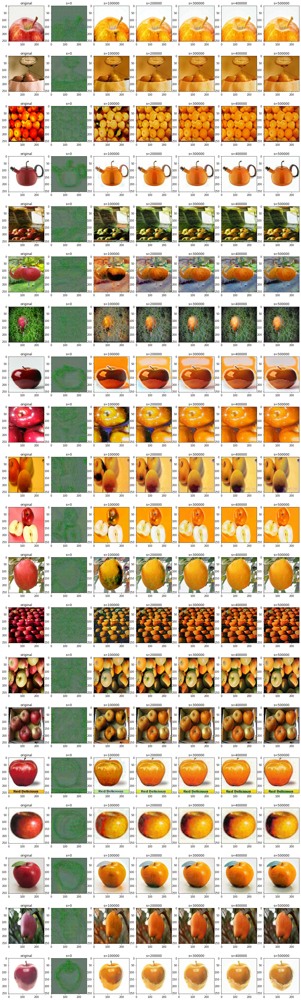

In [5]:
checkpoint_numbers = list(range(0, 500001, 100000))

fig, axes = plt.subplots(nrows=len(examples_apples), ncols=len(checkpoint_numbers)+1, figsize=(20,70))

for ind, example in enumerate(examples_apples):
    input_np = example['image']
    axes[ind, 0].imshow(input_np)
    axes[ind, 0].set(title='original')
        
for j, checkpoint_number in enumerate(checkpoint_numbers):
    saver = tf.compat.v1.train.Saver()
    with tf.compat.v1.Session() as sess:
        saver.restore(sess, input_json.checkpoint_path_format % checkpoint_number)
        for ind, example in enumerate(examples_apples):
            input_np = example['image']
            output_np = sess.run(generated_y, feed_dict={images_x_hwc_pl: input_np})
            image_np = data_provider.undo_normalize_image(output_np)
            axes[ind, j+1].imshow(image_np)
            axes[ind, j+1].set(title='s=%d' % checkpoint_number)

INFO:tensorflow:Restoring parameters from /Users/shengms/Code/cyclegan_w50/model.ckpt-0


INFO:tensorflow:Restoring parameters from /Users/shengms/Code/cyclegan_w50/model.ckpt-0


INFO:tensorflow:Restoring parameters from /Users/shengms/Code/cyclegan_w50/model.ckpt-100000


INFO:tensorflow:Restoring parameters from /Users/shengms/Code/cyclegan_w50/model.ckpt-100000


INFO:tensorflow:Restoring parameters from /Users/shengms/Code/cyclegan_w50/model.ckpt-200000


INFO:tensorflow:Restoring parameters from /Users/shengms/Code/cyclegan_w50/model.ckpt-200000


INFO:tensorflow:Restoring parameters from /Users/shengms/Code/cyclegan_w50/model.ckpt-300000


INFO:tensorflow:Restoring parameters from /Users/shengms/Code/cyclegan_w50/model.ckpt-300000


INFO:tensorflow:Restoring parameters from /Users/shengms/Code/cyclegan_w50/model.ckpt-400000


INFO:tensorflow:Restoring parameters from /Users/shengms/Code/cyclegan_w50/model.ckpt-400000


INFO:tensorflow:Restoring parameters from /Users/shengms/Code/cyclegan_w50/model.ckpt-500000


INFO:tensorflow:Restoring parameters from /Users/shengms/Code/cyclegan_w50/model.ckpt-500000


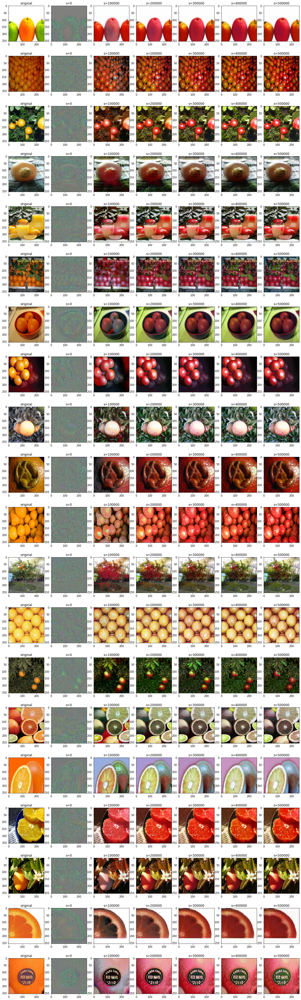

In [6]:
checkpoint_numbers = list(range(0, 500001, 100000))

fig, axes = plt.subplots(nrows=len(examples_oranges), ncols=len(checkpoint_numbers)+1, figsize=(20,70))

for ind, example in enumerate(examples_oranges):
    input_np = example['image']
    axes[ind, 0].imshow(input_np)
    axes[ind, 0].set(title='original')
        
for j, checkpoint_number in enumerate(checkpoint_numbers):
    saver = tf.compat.v1.train.Saver()
    with tf.compat.v1.Session() as sess:
        saver.restore(sess, input_json.checkpoint_path_format % checkpoint_number)
        for ind, example in enumerate(examples_oranges):
            input_np = example['image']
            output_np = sess.run(generated_x, feed_dict={images_y_hwc_pl: input_np})
            image_np = data_provider.undo_normalize_image(output_np)
            axes[ind, j+1].imshow(image_np)
            axes[ind, j+1].set(title='s=%d' % checkpoint_number)